In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split

import statsmodels.formula.api as smf
from sklearn.ensemble import RandomForestClassifier
import numpy as np
from sklearn.linear_model import LinearRegression, LogisticRegression

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, matthews_corrcoef

from scipy.stats import pearsonr
from scipy.stats import spearmanr
import math
from sklearn.decomposition import PCA

from matplotlib.patches import Patch
from matplotlib.lines import Line2D

In [3]:
phase2_df_raw=pd.read_csv('phase2_99_raw_slope(5.18)_newplate.csv',low_memory=False)
wt_df_raw = phase2_df_raw[phase2_df_raw['mutant_ID'] == 'WT']
mutant_df_raw = phase2_df_raw[phase2_df_raw['mutant_ID'] != 'WT']

In [8]:
phase2_df_raw.shape

(34808, 824)

In [4]:
# phase 2 QN (across plates) row: well
phase2_df1=pd.read_csv('phase2_99_qn_across_slopes(5.18).csv',low_memory=False)
wt_df1 = phase2_df1[phase2_df1['mutant_ID'] == 'WT']
mutant_df1= phase2_df1[phase2_df1['mutant_ID'] != 'WT']

In [10]:
phase2_df1.shape

(34808, 825)

In [55]:
# phase 2 QN (within plates) 
phase2_df2=pd.read_csv('phase2_99_qn_within_slopes(5.18).csv',low_memory=False)
wt_df2 = phase2_df2[phase2_df2['mutant_ID'] == 'WT']
mutant_df2= phase2_df2[phase2_df2['mutant_ID'] != 'WT']

In [64]:
phase2_df2.shape

(34808, 825)

In [96]:
# phase 2 bay (across plates + std) 
phase2_df3=pd.read_csv('phase2_99_bay_std_across_slope(5.18).csv',low_memory=False)
wt_df3 = phase2_df3[phase2_df3['mutant_ID'] == 'WT']
mutant_df3= phase2_df3[phase2_df3['mutant_ID'] != 'WT']

In [98]:
phase2_df3.shape

(34808, 824)

In [ ]:
# Define plate groups
plate_groups = {
    '30v1_group': ['30v1', '30v1_1', '30v1_2'],
    '30v3_group': ['30v3', '30v3_1', '30v3_2'],
    '99v2_group': ['99v2', '99v2_1', '99v2_2']
}

# Define remaining individual plates (including 99v1, 99v3 as separate)
individual_plates = [
    '30v2',
    '31v1', '31v2', '31v3',
    '32v1', '32v2', '32v3',
    '99v1', '99v3'
]

# Flatten all plates for plotting and color assignment
all_plates = sum(plate_groups.values(), []) + individual_plates

# Generate color palette
total_needed_colors = len(plate_groups) + len(individual_plates)
base_palette = sns.color_palette('tab20', total_needed_colors)

# Assign colors to each plate
plate_to_color = {}

# First assign group colors
for i, (group_name, plates) in enumerate(plate_groups.items()):
    for plate in plates:
        plate_to_color[plate] = base_palette[i]

# Then assign remaining individual plates
for j, plate in enumerate(individual_plates):
    plate_to_color[plate] = base_palette[len(plate_groups) + j]

# Define light regimes to loop through
light_regimes = ['20h_ML', '20h_HL']

for regime in light_regimes:
    # Filter data for current light regime
    # After filtering mutant_df to get sub_df
    sub_df = mutant_df[(mutant_df['light_regime'] == regime)].copy()
    sub_df = sub_df[sub_df['plate'].isin(all_plates)]  # Only include target plates
    
    # ADD WT plates that start with '99' from wt_df and are in all_plates
    wt_99_df = wt_df[
        (wt_df['light_regime'] == regime) &
        (wt_df['plate'].isin([p for p in all_plates if p.startswith('99')]))
    ].copy()
    
    # Append to sub_df
    sub_df = pd.concat([sub_df, wt_99_df], ignore_index=True)


    # sub_df = mutant_df[(mutant_df['light_regime'] == regime)].copy()
    # sub_df = sub_df[sub_df['plate'].isin(all_plates)]  # Only include target plates
    sub_df = sub_df.sort_values(by='plate').reset_index(drop=True)
    sub_df['index'] = sub_df.index

    # Compute summary stats for horizontal lines
    mean_val = sub_df['y2_slope'].mean()
    q1 = sub_df['y2_slope'].quantile(0.25)
    q3 = sub_df['y2_slope'].quantile(0.75)

    # Create the plot
    plt.figure(figsize=(14, 6))

    # Plot all relevant data (including 99xx) as dots
    sns.scatterplot(
        data=sub_df,
        x='index',
        y='y2_slope',
        hue='plate',
        palette=plate_to_color,
        alpha=0.7,
        s=30,
        legend=False
    )

    # Plot wild types from standard WT df (excluding 99 plates)
    sub_wt_df = wt_df[
        (wt_df['light_regime'] == regime) &
        (wt_df['plate'].isin([p for p in all_plates if not p.startswith('99')]))
    ].copy()

    # Align index for WT plotting
    plate_to_index = sub_df.groupby('plate')['index'].median().to_dict()
    sub_wt_df['index'] = sub_wt_df['plate'].map(plate_to_index)

    # Plot WT as X marker
    sns.scatterplot(
        data=sub_wt_df,
        x='index',
        y='y2_slope',
        hue='plate',
        palette=plate_to_color,
        marker='X',
        s=80,
        edgecolor='black',
        legend=False
    )

    # Add horizontal reference lines
    plt.axhline(mean_val, color='black', linestyle='-', linewidth=1.2, label='Mutant Mean')
    plt.axhline(q1, color='gray', linestyle='--', linewidth=1, label='25% Quantile')
    plt.axhline(q3, color='gray', linestyle='--', linewidth=1, label='75% Quantile')

    # Build legend
    legend_elements = [
        Patch(facecolor=plate_to_color[plate], label=plate)
        for plate in all_plates
    ]
    legend_elements += [
        Line2D([0], [0], marker='X', color='w', markerfacecolor='gray',
               markeredgecolor='black', markersize=10, label='WT (non-99)'),
        Patch(facecolor='black', label='Mutant Mean'),
        Patch(facecolor='gray', label='25% / 75%', linestyle='--')
    ]

    # Final plot settings
    plt.legend(handles=legend_elements, bbox_to_anchor=(1.05, 1), loc='upper left', title="Legend")
    plt.xlabel("Mutants and WT (per plate)")
    plt.ylabel("y2_slope")
    plt.title(f"Q.N. (across plates) Slope — {regime}")
    plt.tight_layout()
    plt.show()

In [28]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

def plot_y2_slope_by_plate(
    wt_df,
    mutant_df,
    slope,
    light_regimes,
    title_prefix='',
    shared_ylim=None,
    shared_xlim=None
):
    # Define plate groups
    plate_groups = {
        '30v1_group': ['30v1', '30v1_1', '30v1_2'],
        '30v3_group': ['30v3', '30v3_1', '30v3_2'],
        '99v2_group': ['99v2', '99v2_1', '99v2_2']
    }

    # Define remaining individual plates (including 99v1, 99v3 as separate)
    individual_plates = [
        '30v2',
        '31v1', '31v2', '31v3',
        '32v1', '32v2', '32v3',
        '99v1', '99v3'
    ]

    # Flatten all plates for plotting and color assignment
    all_plates = sum(plate_groups.values(), []) + individual_plates

    # Generate color palette
    total_needed_colors = len(plate_groups) + len(individual_plates)
    base_palette = sns.color_palette('tab20', total_needed_colors)

    # Assign colors
    plate_to_color = {}
    for i, (group_name, plates) in enumerate(plate_groups.items()):
        for plate in plates:
            plate_to_color[plate] = base_palette[i]
    for j, plate in enumerate(individual_plates):
        plate_to_color[plate] = base_palette[len(plate_groups) + j]

    for regime in light_regimes:
        # Filter mutant data
        sub_df = mutant_df[(mutant_df['light_regime'] == regime)]
        sub_df = sub_df[sub_df['plate'].isin(all_plates)]

        # Add WT data for 99 plates
        wt_99_df = wt_df[
            (wt_df['light_regime'] == regime) &
            (wt_df['plate'].isin([p for p in all_plates if p.startswith('99')]))
        ]
        sub_df = pd.concat([sub_df, wt_99_df], ignore_index=True)

        # Sort and index
        sub_df = sub_df.sort_values(by='plate').reset_index(drop=True)
        sub_df['index'] = sub_df.index

        # Summary stats for lines
        mean_val = sub_df[slope].mean()
        q1 = sub_df[slope].quantile(0.25)
        q3 = sub_df[slope].quantile(0.75)

        # Plot
        plt.figure(figsize=(14, 6))

        # Mutants + 99 plates as dots
        sns.scatterplot(
            data=sub_df,
            x='index',
            y=slope,
            hue='plate',
            palette=plate_to_color,
            alpha=0.7,
            s=30,
            legend=False
        )

        # Non-99 WT as Xs
        sub_wt_df = wt_df[
            (wt_df['light_regime'] == regime) &
            (wt_df['plate'].isin([p for p in all_plates if not p.startswith('99')]))
        ].copy()
        plate_to_index = sub_df.groupby('plate')['index'].median().to_dict()
        sub_wt_df['index'] = sub_wt_df['plate'].map(plate_to_index)

        sns.scatterplot(
            data=sub_wt_df,
            x='index',
            y=slope,
            hue='plate',
            palette=plate_to_color,
            marker='X',
            s=80,
            edgecolor='black',
            legend=False
        )

        # Add horizontal lines
        plt.axhline(mean_val, color='black', linestyle='-', linewidth=1.2, label='Mutant Mean')
        plt.axhline(q1, color='gray', linestyle='--', linewidth=1, label='25% Quantile')
        plt.axhline(q3, color='gray', linestyle='--', linewidth=1, label='75% Quantile')

        # Shared axis limits if provided
        if shared_ylim:
            plt.ylim(shared_ylim)
        if shared_xlim:
            plt.xlim(shared_xlim)

        # Legend
        legend_elements = [
            Patch(facecolor=plate_to_color[plate], label=plate)
            for plate in all_plates
        ]
        legend_elements += [
            Line2D([0], [0], marker='X', color='w', markerfacecolor='gray',
                   markeredgecolor='black', markersize=10, label='WT (non-99)'),
            Patch(facecolor='black', label='Mutant Mean'),
            Patch(facecolor='gray', label='25% / 75%', linestyle='--')
        ]

        plt.legend(handles=legend_elements, bbox_to_anchor=(1.05, 1), loc='upper left', title="Legend")
        plt.xlabel("Mutants and WT (per plate)")
        plt.ylabel("y2_slope")
        plt.title(f"{title_prefix} Slope — {regime}")
        plt.tight_layout()
        plt.show()


In [16]:
global_x_length

25553

In [17]:
len(mutant_df1)

25553

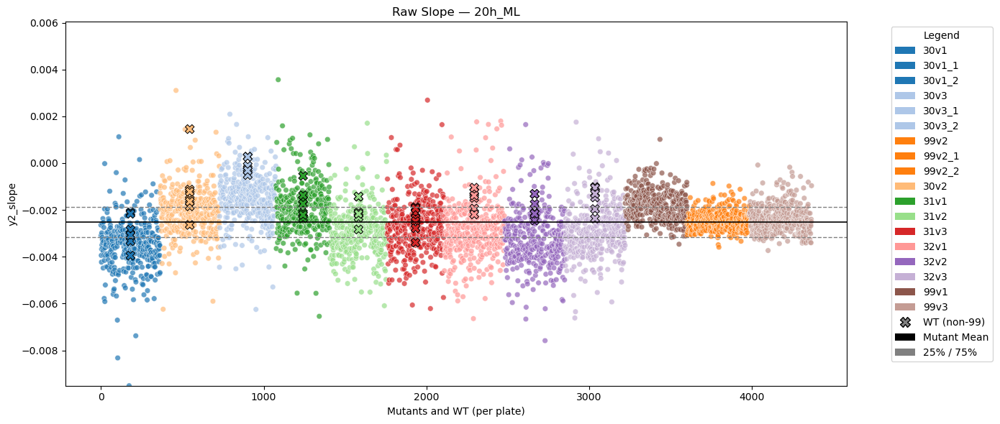

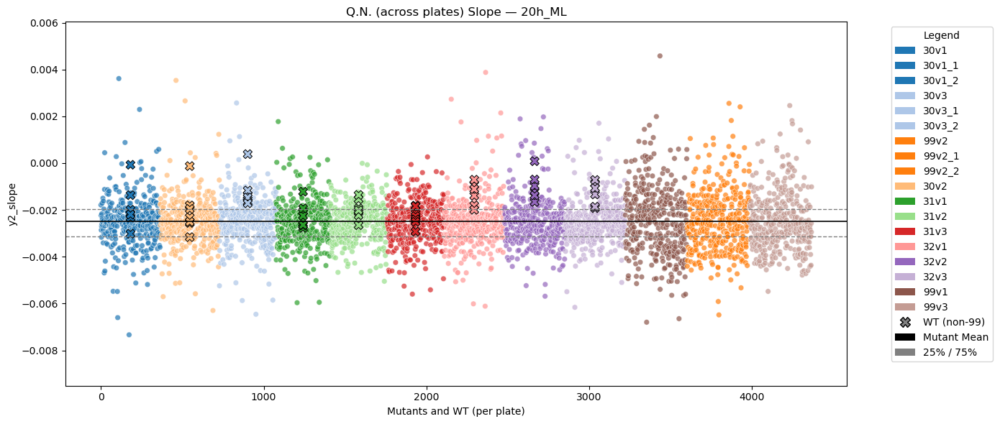

In [74]:
## 20h_ML
combined_df = pd.concat([phase2_df_raw,phase2_df1, phase2_df2, phase2_df3])
global_y_limits = (combined_df[combined_df['light_regime']=='20h_ML']['y2_slope'].min(), 
                   combined_df[combined_df['light_regime']=='20h_ML']['y2_slope'].max())


# Plot raw
plot_y2_slope_by_plate(
    wt_df=wt_df_raw,
    mutant_df=mutant_df_raw,
    title_prefix='Raw',
    shared_ylim=global_y_limits,
    light_regimes=['20h_ML'],
    slope='y2_slope'
)

plot_y2_slope_by_plate(
    wt_df=wt_df1,
    mutant_df=mutant_df1,
    title_prefix='Q.N. (across plates)',
    shared_ylim=global_y_limits,
    light_regimes=['20h_ML'],
    slope='y2_slope'
)


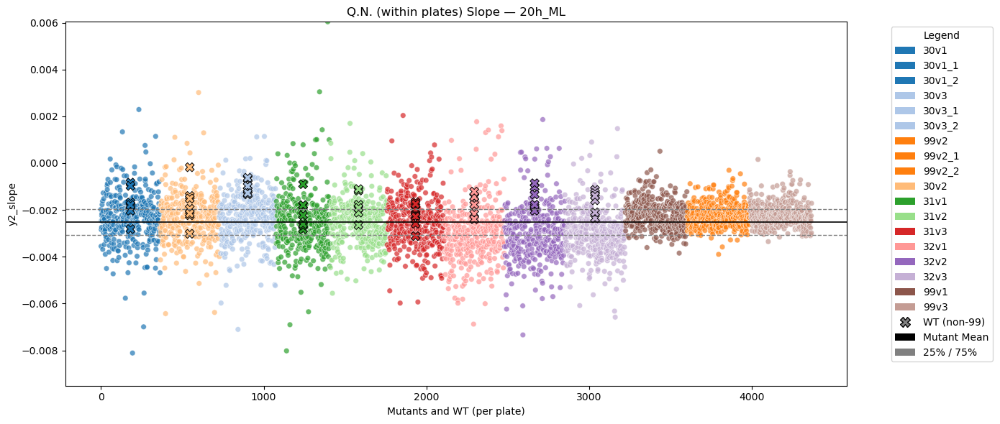

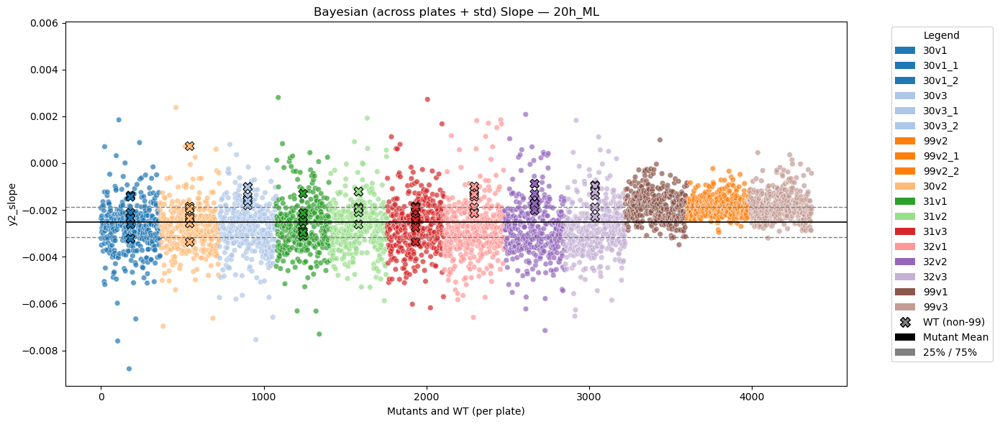

In [73]:
plot_y2_slope_by_plate(
    wt_df=wt_df2,
    mutant_df=mutant_df2,
    title_prefix='Q.N. (within plates)',
    shared_ylim=global_y_limits,
    light_regimes=['20h_ML'],
    slope='y2_slope'
)

plot_y2_slope_by_plate(
    wt_df=wt_df3,
    mutant_df=mutant_df3,
    title_prefix='Bayesian (across plates + std)',
    shared_ylim=global_y_limits,
    light_regimes=['20h_ML'],
    slope='y2_slope'
)


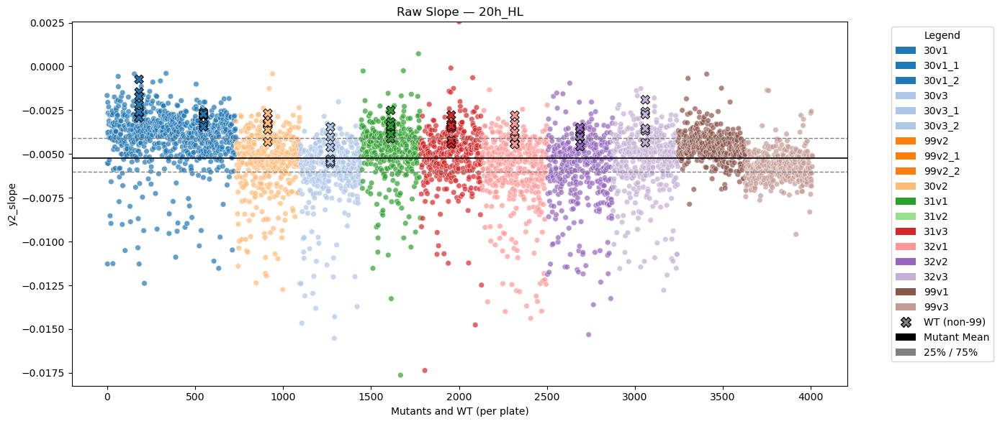

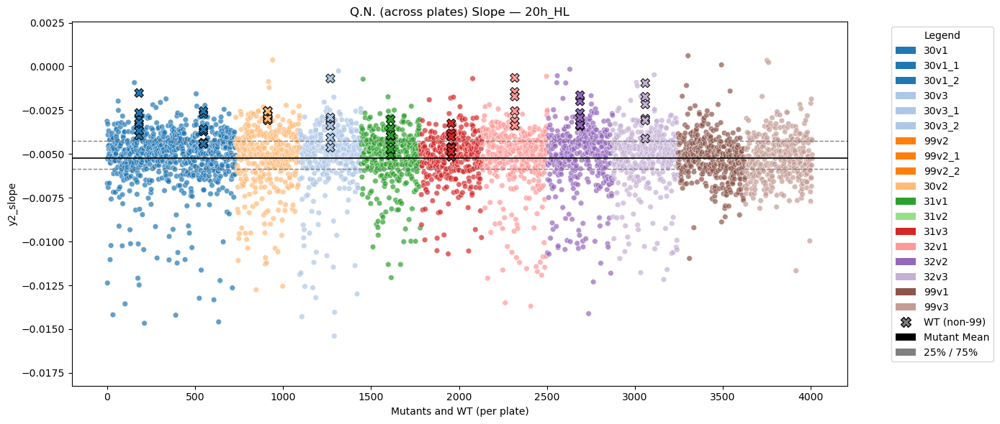

In [79]:
## 20h_HL
combined_df = pd.concat([phase2_df_raw,phase2_df1, phase2_df2, phase2_df3])
global_y_limits = (combined_df[combined_df['light_regime']=='20h_HL']['y2_slope'].min(), 
                   combined_df[combined_df['light_regime']=='20h_HL']['y2_slope'].max())


# Plot raw
plot_y2_slope_by_plate(
    wt_df=wt_df_raw,
    mutant_df=mutant_df_raw,
    title_prefix='Raw',
    shared_ylim=global_y_limits,
    light_regimes=['20h_HL'],
    slope='y2_slope'
)

plot_y2_slope_by_plate(
    wt_df=wt_df1,
    mutant_df=mutant_df1,
    title_prefix='Q.N. (across plates)',
    shared_ylim=global_y_limits,
    light_regimes=['20h_HL'],
    slope='y2_slope'
)



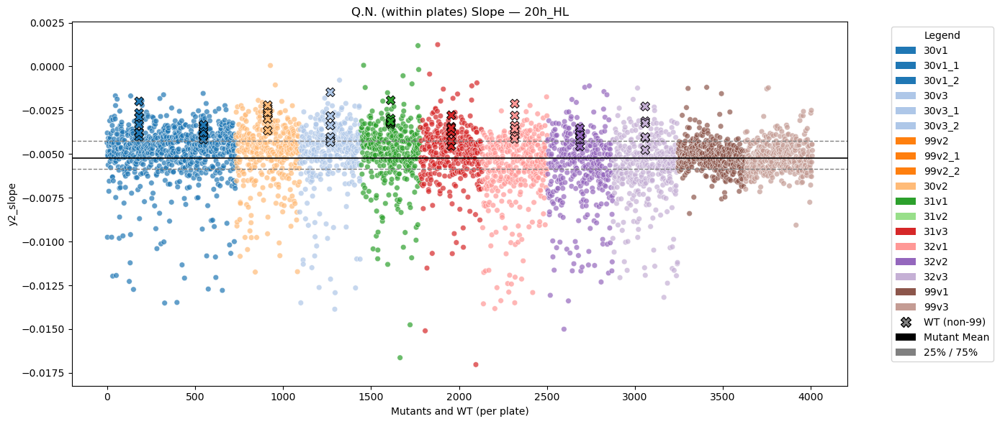

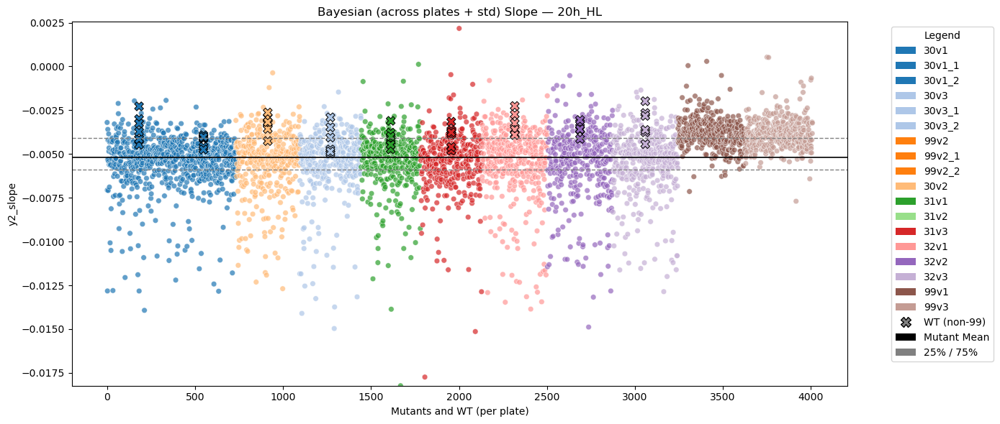

In [80]:
plot_y2_slope_by_plate(
    wt_df=wt_df2,
    mutant_df=mutant_df2,
    title_prefix='Q.N. (within plates)',
    shared_ylim=global_y_limits,
    light_regimes=['20h_HL'],
    slope='y2_slope'
)

plot_y2_slope_by_plate(
    wt_df=wt_df3,
    mutant_df=mutant_df3,
    title_prefix='Bayesian (across plates + std)',
    shared_ylim=global_y_limits,
    light_regimes=['20h_HL'],
    slope='y2_slope'
)

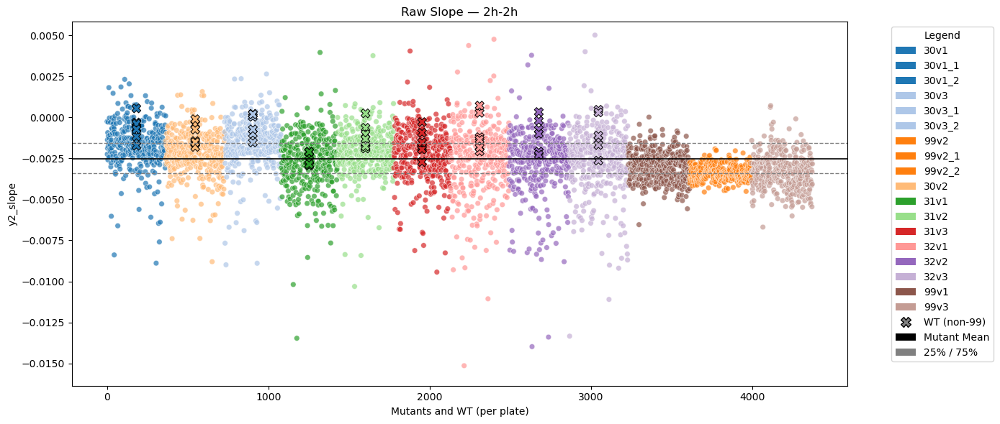

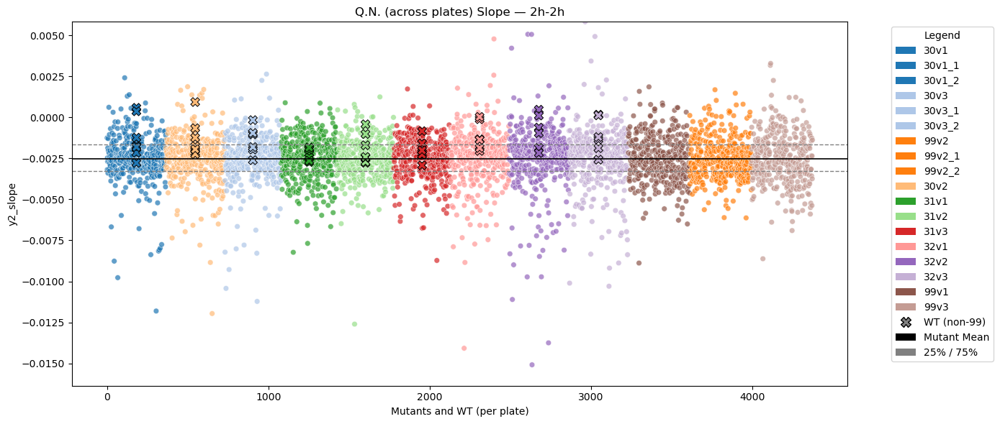

In [75]:
## 2h-2h
combined_df = pd.concat([phase2_df_raw,phase2_df1, phase2_df2, phase2_df3])
global_y_limits = (combined_df[combined_df['light_regime']=='2h-2h']['y2_slope_on'].min(), 
                   combined_df[combined_df['light_regime']=='2h-2h']['y2_slope_on'].max())


# Plot raw
plot_y2_slope_by_plate(
    wt_df=wt_df_raw,
    mutant_df=mutant_df_raw,
    title_prefix='Raw',
    shared_ylim=global_y_limits,
    light_regimes=['2h-2h'],
    slope='y2_slope_on'
)

plot_y2_slope_by_plate(
    wt_df=wt_df1,
    mutant_df=mutant_df1,
    title_prefix='Q.N. (across plates)',
    shared_ylim=global_y_limits,
    light_regimes=['2h-2h'],
    slope='y2_slope_on'
)



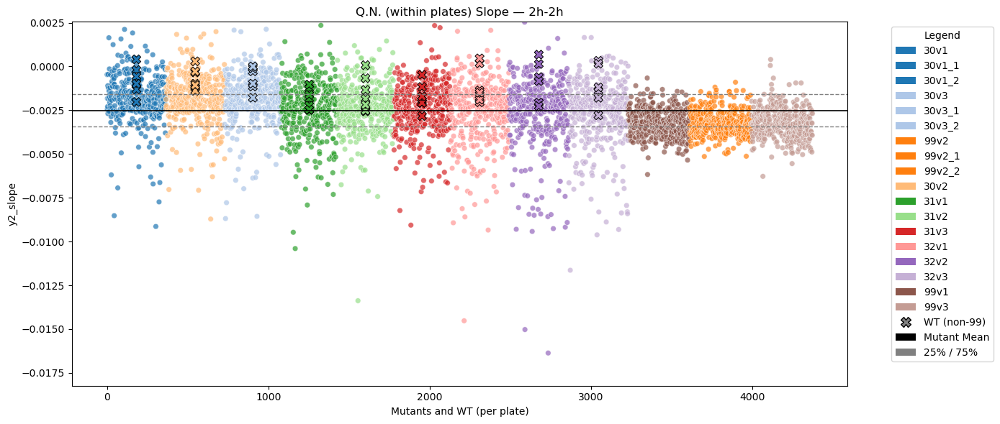

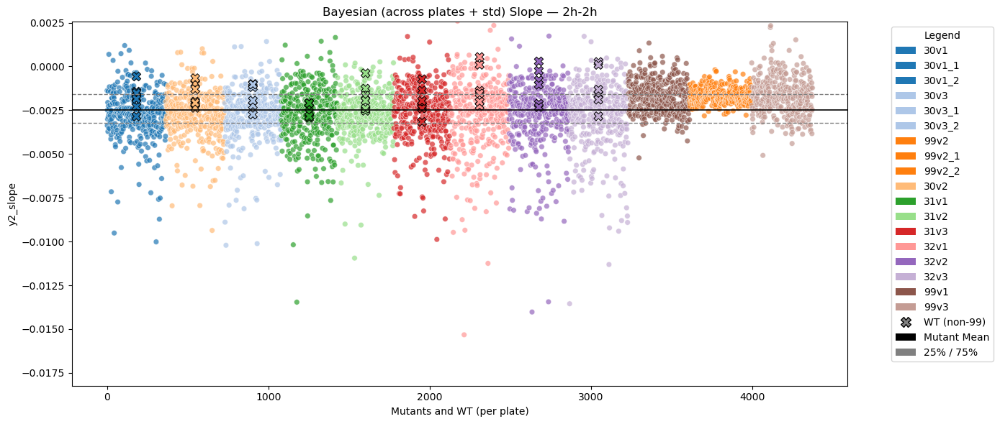

In [82]:
plot_y2_slope_by_plate(
    wt_df=wt_df2,
    mutant_df=mutant_df2,
    title_prefix='Q.N. (within plates)',
    shared_ylim=global_y_limits,
    light_regimes=['2h-2h'],
    slope='y2_slope_on'
)

plot_y2_slope_by_plate(
    wt_df=wt_df3,
    mutant_df=mutant_df3,
    title_prefix='Bayesian (across plates + std)',
    shared_ylim=global_y_limits,
    light_regimes=['2h-2h'],
    slope='y2_slope_on'
)

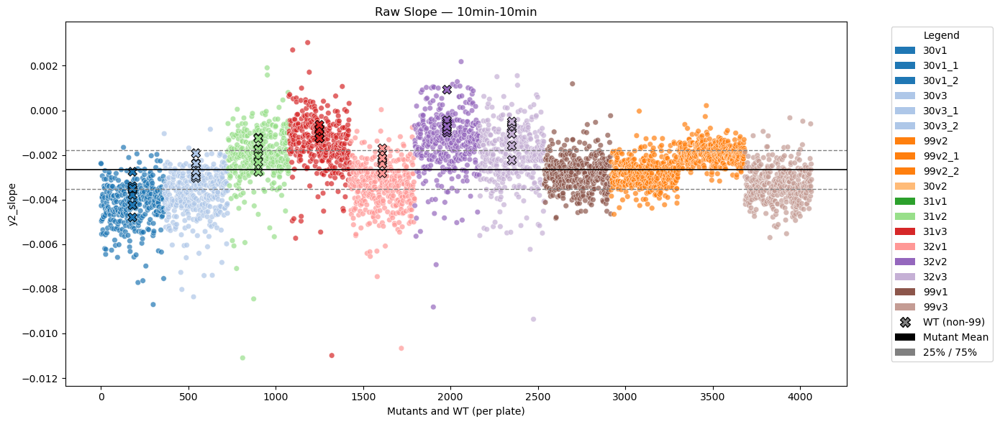

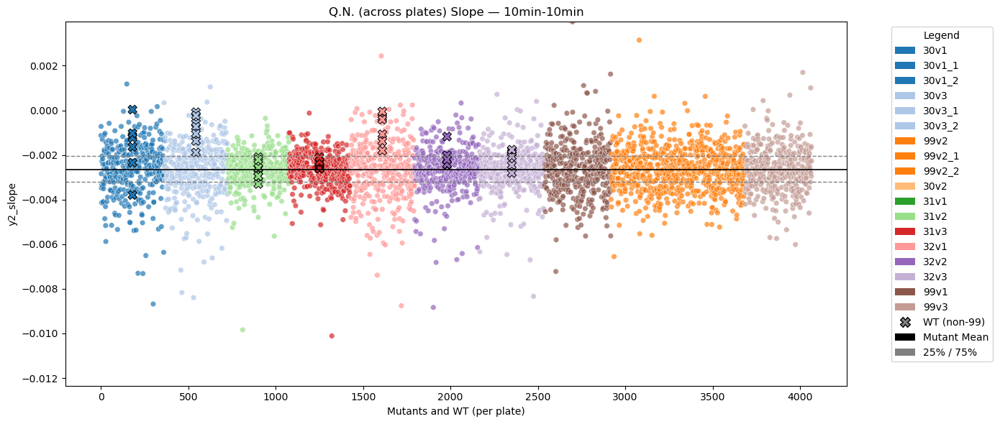

In [77]:
## 10min-10min
combined_df = pd.concat([phase2_df_raw,phase2_df1, phase2_df2, phase2_df3])
global_y_limits = (combined_df[combined_df['light_regime']=='10min-10min']['y2_slope_on'].min(), 
                   combined_df[combined_df['light_regime']=='10min-10min']['y2_slope_on'].max())


# Plot raw
plot_y2_slope_by_plate(
    wt_df=wt_df_raw,
    mutant_df=mutant_df_raw,
    title_prefix='Raw',
    shared_ylim=global_y_limits,
    light_regimes=['10min-10min'],
    slope='y2_slope_on'
)

plot_y2_slope_by_plate(
    wt_df=wt_df1,
    mutant_df=mutant_df1,
    title_prefix='Q.N. (across plates)',
    shared_ylim=global_y_limits,
    light_regimes=['10min-10min'],
    slope='y2_slope_on'
)



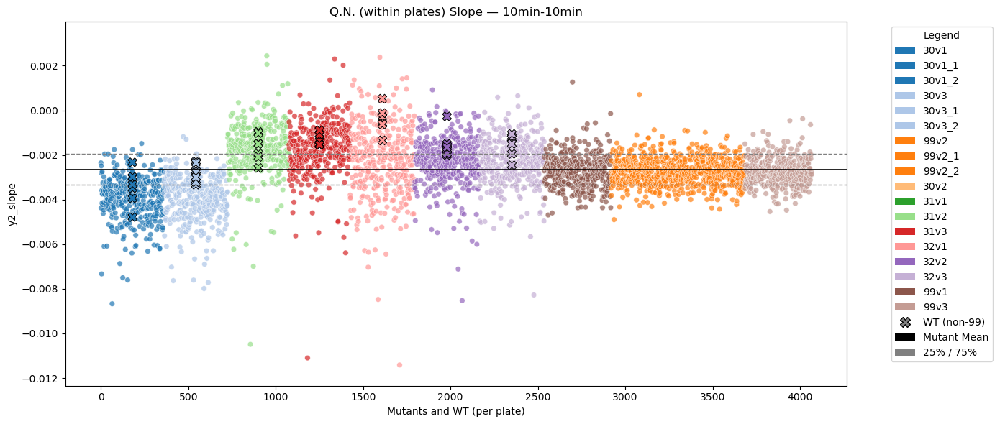

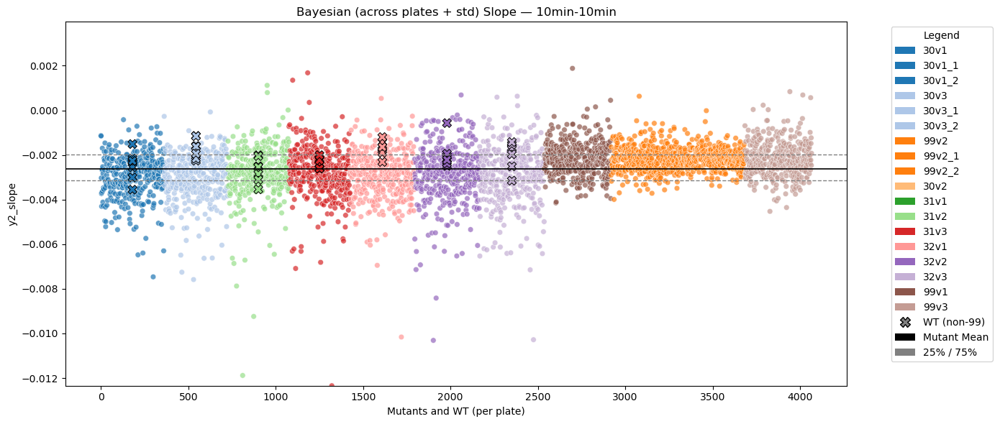

In [78]:
plot_y2_slope_by_plate(
    wt_df=wt_df2,
    mutant_df=mutant_df2,
    title_prefix='Q.N. (within plates)',
    shared_ylim=global_y_limits,
    light_regimes=['10min-10min'],
    slope='y2_slope_on'
)
plot_y2_slope_by_plate(
    wt_df=wt_df3,
    mutant_df=mutant_df3,
    title_prefix='Bayesian (across plates + std)',
    shared_ylim=global_y_limits,
    light_regimes=['10min-10min'],
    slope='y2_slope_on'
)

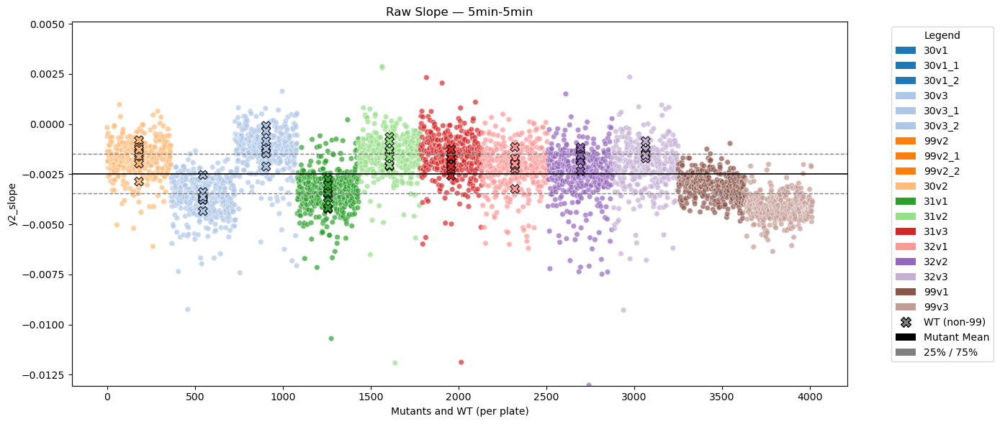

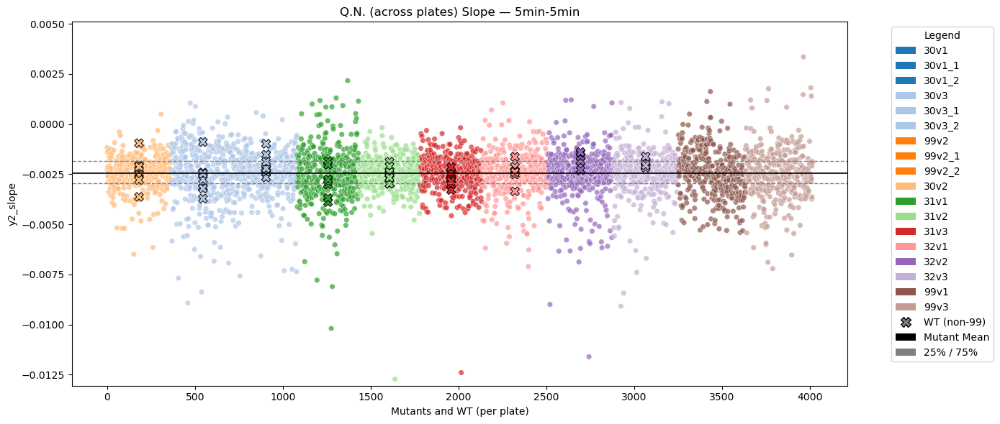

In [99]:
## 5min-5min
combined_df = pd.concat([phase2_df_raw,phase2_df1, phase2_df2, phase2_df3])
global_y_limits = (combined_df[combined_df['light_regime']=='5min-5min']['y2_slope_on'].min(), 
                   combined_df[combined_df['light_regime']=='5min-5min']['y2_slope_on'].max())


# Plot raw
plot_y2_slope_by_plate(
    wt_df=wt_df_raw,
    mutant_df=mutant_df_raw,
    title_prefix='Raw',
    shared_ylim=global_y_limits,
    light_regimes=['5min-5min'],
    slope='y2_slope_on'
)

plot_y2_slope_by_plate(
    wt_df=wt_df1,
    mutant_df=mutant_df1,
    title_prefix='Q.N. (across plates)',
    shared_ylim=global_y_limits,
    light_regimes=['5min-5min'],
    slope='y2_slope_on'
)


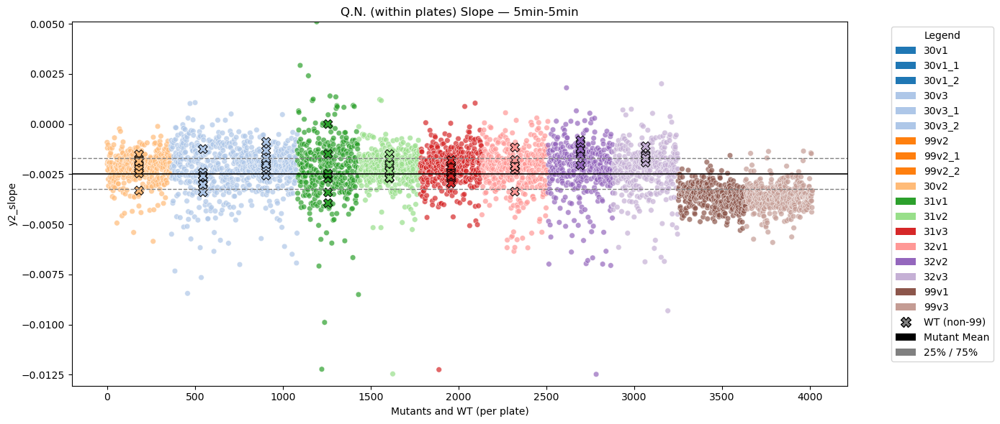

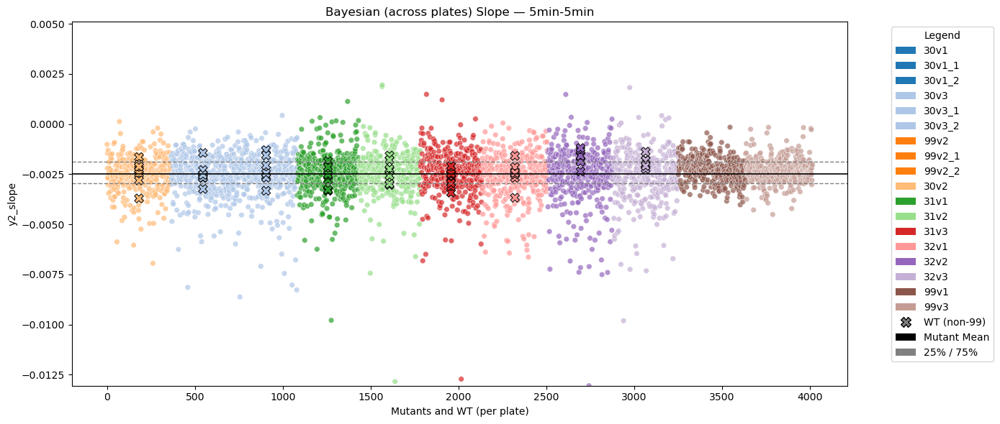

In [100]:
plot_y2_slope_by_plate(
    wt_df=wt_df2,
    mutant_df=mutant_df2,
    title_prefix='Q.N. (within plates)',
    shared_ylim=global_y_limits,
    light_regimes=['5min-5min'],
    slope='y2_slope_on'
)

plot_y2_slope_by_plate(
    wt_df=wt_df3,
    mutant_df=mutant_df3,
    title_prefix='Bayesian (across plates)',
    shared_ylim=global_y_limits,
    light_regimes=['5min-5min'],
    slope='y2_slope_on'
)


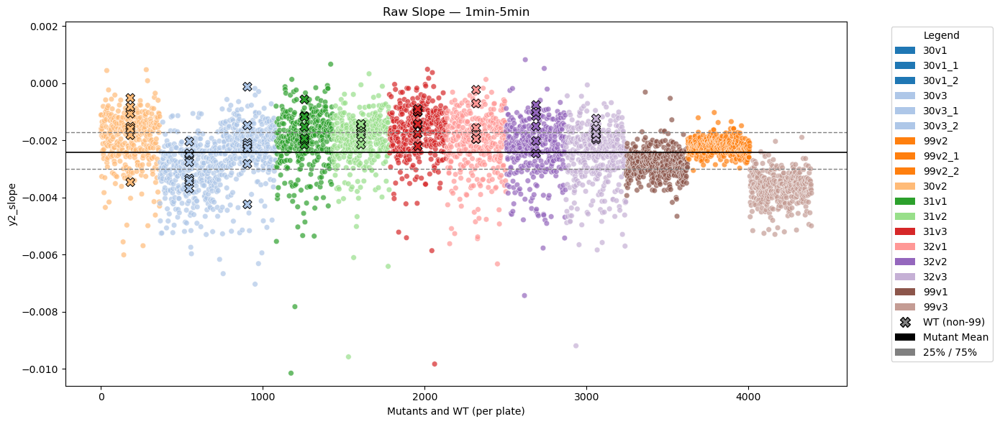

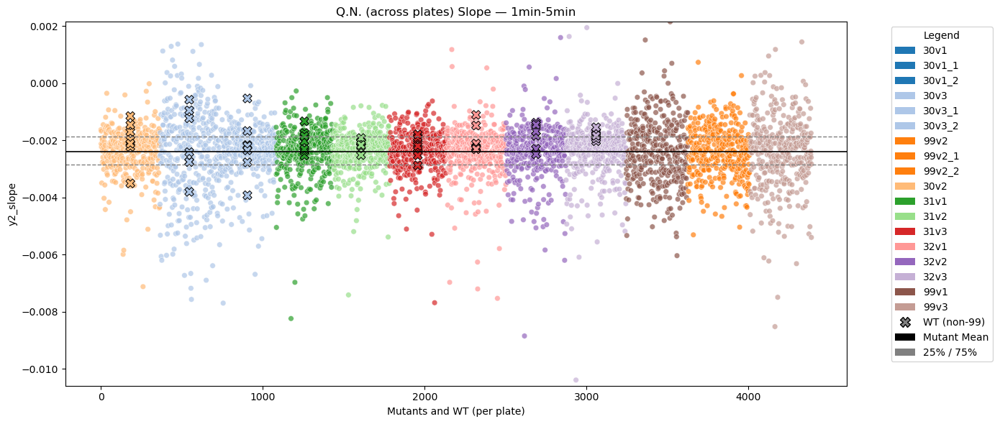

In [94]:
## 1min-5min
combined_df = pd.concat([phase2_df_raw,phase2_df1, phase2_df2, phase2_df3])
global_y_limits = (combined_df[combined_df['light_regime']=='1min-5min']['y2_slope_on'].min(), 
                   combined_df[combined_df['light_regime']=='1min-5min']['y2_slope_on'].max())


# Plot raw
plot_y2_slope_by_plate(
    wt_df=wt_df_raw,
    mutant_df=mutant_df_raw,
    title_prefix='Raw',
    shared_ylim=global_y_limits,
    light_regimes=['1min-5min'],
    slope='y2_slope_on'
)

plot_y2_slope_by_plate(
    wt_df=wt_df1,
    mutant_df=mutant_df1,
    title_prefix='Q.N. (across plates)',
    shared_ylim=global_y_limits,
    light_regimes=['1min-5min'],
    slope='y2_slope_on'
)


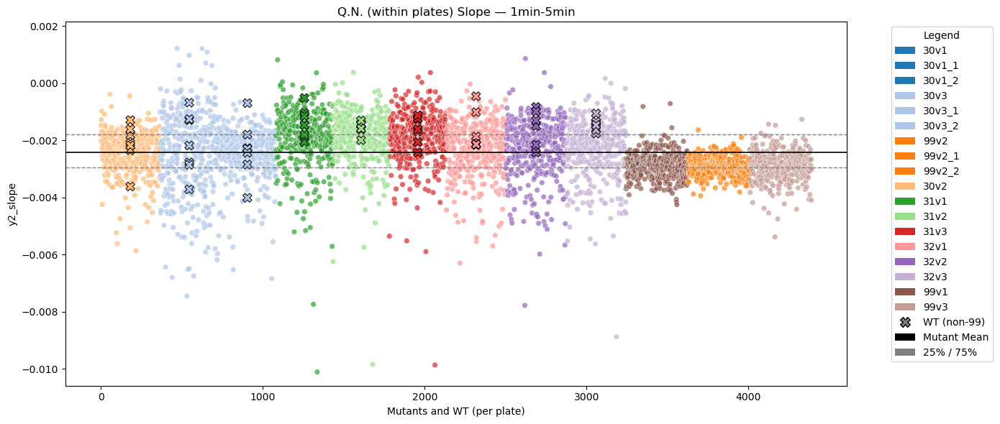

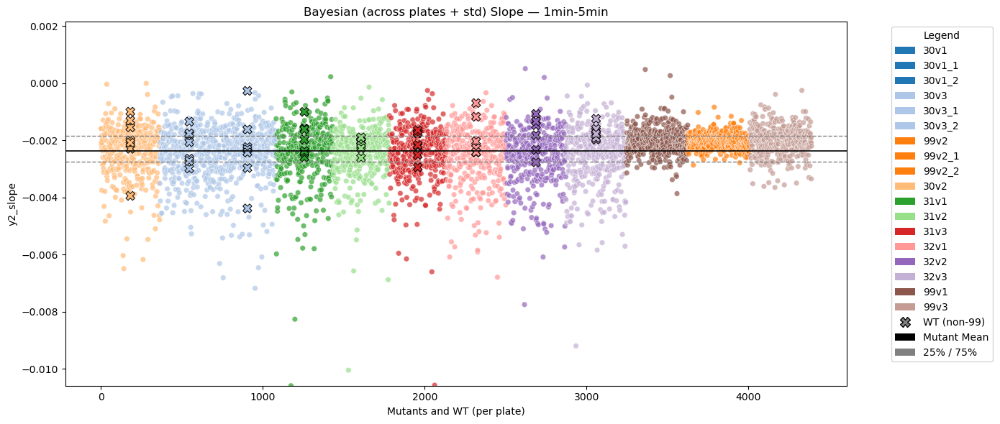

In [95]:
plot_y2_slope_by_plate(
    wt_df=wt_df2,
    mutant_df=mutant_df2,
    title_prefix='Q.N. (within plates)',
    shared_ylim=global_y_limits,
    light_regimes=['1min-5min'],
    slope='y2_slope_on'
)

plot_y2_slope_by_plate(
    wt_df=wt_df3,
    mutant_df=mutant_df3,
    title_prefix='Bayesian (across plates + std)',
    shared_ylim=global_y_limits,
    light_regimes=['1min-5min'],
    slope='y2_slope_on'
)


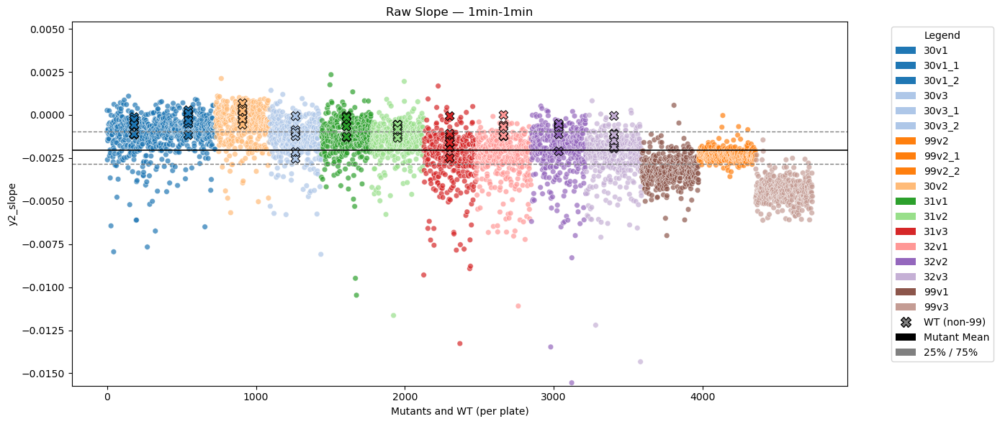

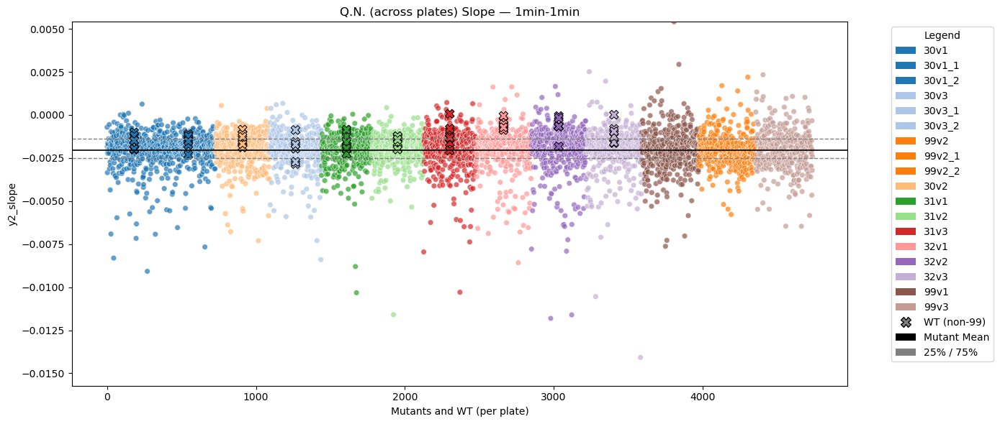

In [92]:
## 1min-1min
combined_df = pd.concat([phase2_df_raw,phase2_df1, phase2_df2, phase2_df3])
global_y_limits = (combined_df[combined_df['light_regime']=='1min-1min']['y2_slope_on'].min(), 
                   combined_df[combined_df['light_regime']=='1min-1min']['y2_slope_on'].max())


# Plot raw
plot_y2_slope_by_plate(
    wt_df=wt_df_raw,
    mutant_df=mutant_df_raw,
    title_prefix='Raw',
    shared_ylim=global_y_limits,
    light_regimes=['1min-1min'],
    slope='y2_slope_on'
)

plot_y2_slope_by_plate(
    wt_df=wt_df1,
    mutant_df=mutant_df1,
    title_prefix='Q.N. (across plates)',
    shared_ylim=global_y_limits,
    light_regimes=['1min-1min'],
    slope='y2_slope_on'
)


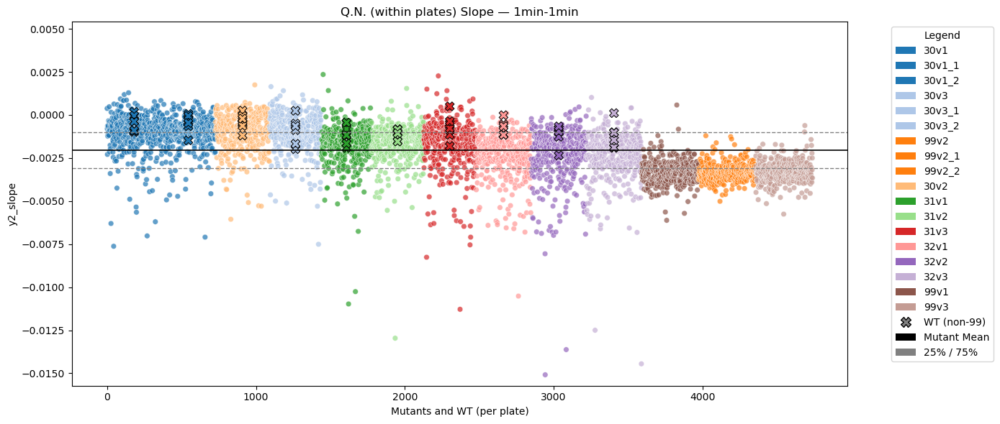

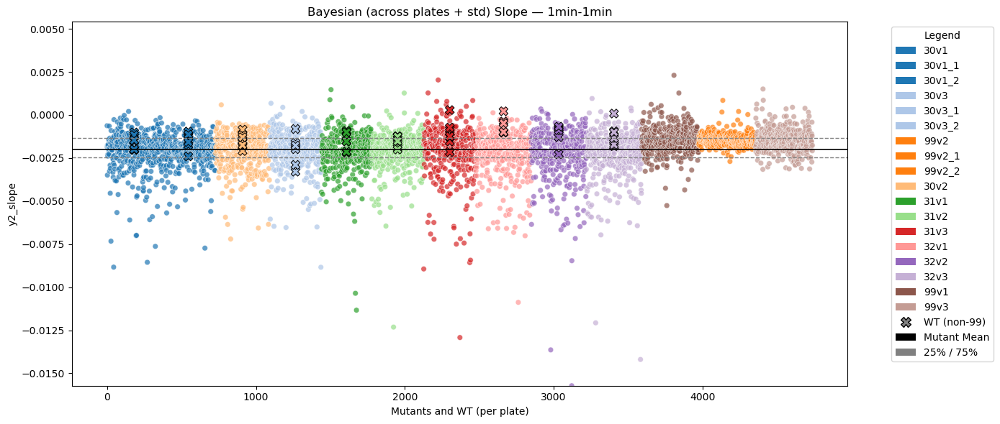

In [93]:
plot_y2_slope_by_plate(
    wt_df=wt_df2,
    mutant_df=mutant_df2,
    title_prefix='Q.N. (within plates)',
    shared_ylim=global_y_limits,
    light_regimes=['1min-1min'],
    slope='y2_slope_on'
)

plot_y2_slope_by_plate(
    wt_df=wt_df3,
    mutant_df=mutant_df3,
    title_prefix='Bayesian (across plates + std)',
    shared_ylim=global_y_limits,
    light_regimes=['1min-1min'],
    slope='y2_slope_on'
)

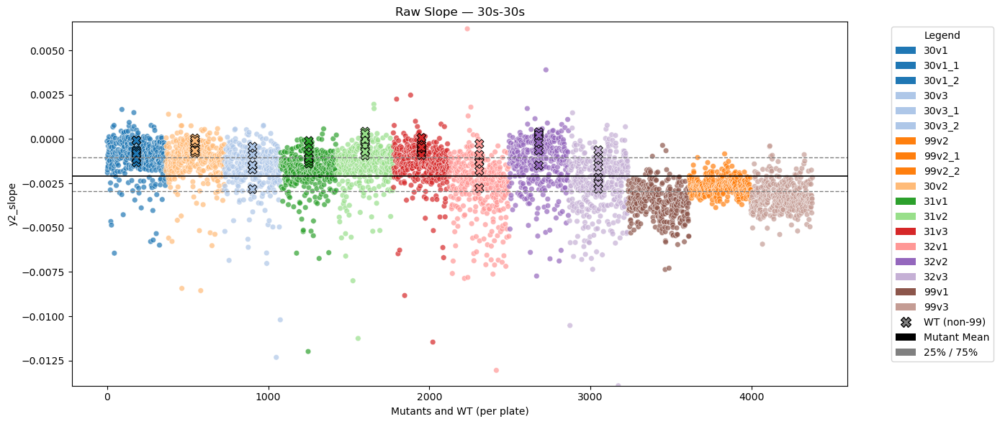

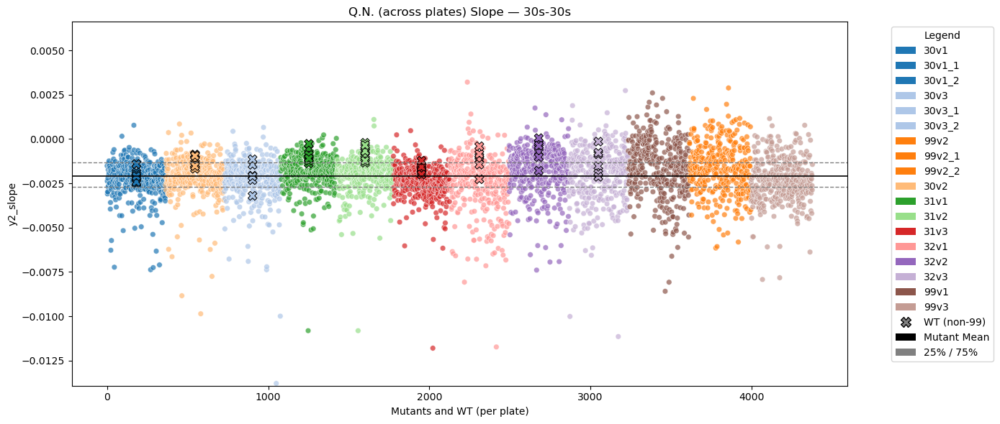

In [89]:
## 30s-30s
combined_df = pd.concat([phase2_df_raw,phase2_df1, phase2_df2, phase2_df3])
global_y_limits = (combined_df[combined_df['light_regime']=='30s-30s']['y2_slope_on'].min(), 
                   combined_df[combined_df['light_regime']=='30s-30s']['y2_slope_on'].max())


# Plot raw
plot_y2_slope_by_plate(
    wt_df=wt_df_raw,
    mutant_df=mutant_df_raw,
    title_prefix='Raw',
    shared_ylim=global_y_limits,
    light_regimes=['30s-30s'],
    slope='y2_slope_on'
)

plot_y2_slope_by_plate(
    wt_df=wt_df1,
    mutant_df=mutant_df1,
    title_prefix='Q.N. (across plates)',
    shared_ylim=global_y_limits,
    light_regimes=['30s-30s'],
    slope='y2_slope_on'
)


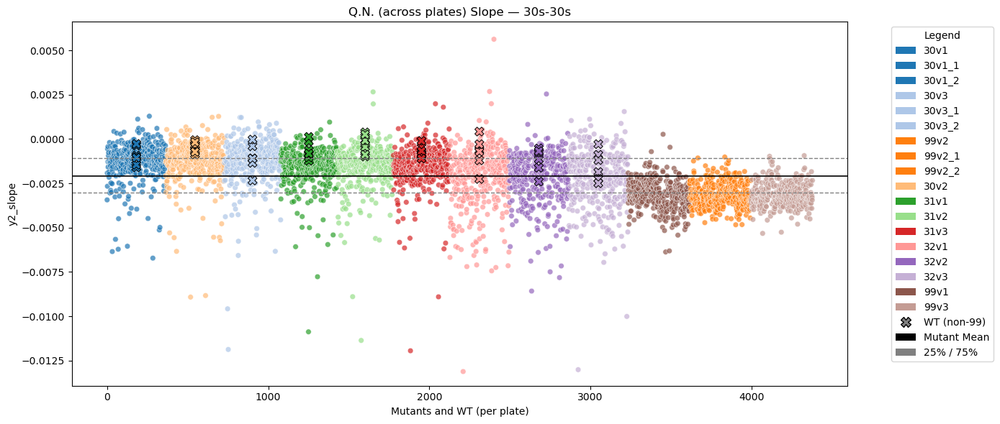

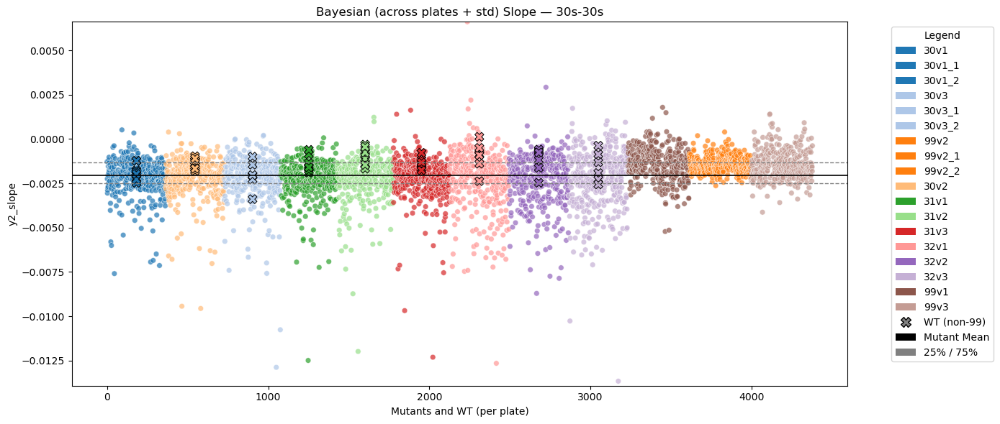

In [90]:
plot_y2_slope_by_plate(
    wt_df=wt_df2,
    mutant_df=mutant_df2,
    title_prefix='Q.N. (across plates)',
    shared_ylim=global_y_limits,
    light_regimes=['30s-30s'],
    slope='y2_slope_on'
)

plot_y2_slope_by_plate(
    wt_df=wt_df3,
    mutant_df=mutant_df3,
    title_prefix='Bayesian (across plates + std)',
    shared_ylim=global_y_limits,
    light_regimes=['30s-30s'],
    slope='y2_slope_on'
)